#1).....Extracting feature with VGG16 Network......

In [ ]:
!unzip /content/tree.zip

In [ ]:
from os import listdir
from pickle import dump
from keras.applications.vgg16 import VGG16
from keras.applications.vgg19 import VGG19
from keras.applications.resnet import ResNet50
from keras.preprocessing.image import load_img
from keras.preprocessing.image import img_to_array
from keras.applications.vgg16 import preprocess_input
from keras.applications.vgg19 import preprocess_input
from keras.applications.resnet import preprocess_input
from keras.models import Model

# extract features from each photo in the directory
def extract_features(directory):
	# load the model

	# model = VGG16()
  # model = VGG19()
	model = ResNet50()
 
	# re-structure the model
	model.layers.pop()
	model = Model(inputs=model.inputs, outputs=model.layers[-1].output)
	# summarize
	print(model.summary())
	# extract features from each photo
	features = dict()
	for name in listdir(directory):
		# load an image from file
		filename = directory + '/' + name
		image = load_img(filename, target_size=(224, 224))
		# convert the image pixels to a numpy array
		image = img_to_array(image)
		# reshape data for the model
		image = image.reshape((1, image.shape[0], image.shape[1], image.shape[2]))
		# prepare the image for the VGG model
		image = preprocess_input(image)
		# get features
		feature = model.predict(image, verbose=0)
		# get image id
		image_id = name.split('.')[0]
		# store feature
		features[image_id] = feature
		print('>%s' % name)
	return features

# extract features from all images
directory = 'tree'
features = extract_features(directory)
print('Extracted Features: %d' % len(features))
# save to file
dump(features, open('tree_features.pkl', 'wb'))

# 2).....Import The Pkl File,Check features..........

In [29]:
import pickle
pickle_in = open("tree_features.pkl","rb")
features = pickle.load(pickle_in)

FileNotFoundError: ignored

In [ ]:
len(features)

714

In [ ]:
features['BetalNuts (1)'][0,10:100]

array([1.52338616e-04, 6.00575935e-04, 3.42449348e-04, 5.54982034e-05,
       3.39014077e-04, 3.44370026e-04, 1.61520147e-04, 5.97875987e-05,
       1.89834071e-04, 2.64333030e-05, 1.39300364e-05, 1.11836183e-04,
       3.23007785e-04, 2.23273513e-04, 1.25532679e-04, 5.89546071e-05,
       2.10446422e-04, 7.21847609e-05, 2.32576913e-05, 2.17237921e-05,
       2.05332599e-05, 1.07830383e-05, 5.12985243e-05, 1.00252416e-03,
       1.22336554e-04, 2.81106404e-05, 1.70095824e-04, 6.35514652e-06,
       2.29765610e-05, 4.35226713e-04, 2.15434357e-05, 5.87603390e-05,
       1.98858368e-04, 2.04188880e-04, 3.34756187e-05, 2.05992590e-04,
       1.99195383e-05, 1.25108592e-04, 4.76639843e-06, 5.09054807e-05,
       4.03605780e-04, 3.64100629e-06, 2.70553010e-05, 7.07477593e-05,
       6.65810076e-05, 4.44920224e-05, 2.58149430e-05, 5.89531446e-05,
       6.39095728e-04, 1.48212726e-04, 5.39200300e-05, 4.55824693e-06,
       2.50446228e-05, 7.29006570e-05, 2.17617926e-04, 1.70663325e-03,
      

In [ ]:
features

{'2367idea99litchi_root_rot': array([[2.15641339e-04, 2.28552599e-05, 1.55533853e-05, 2.87435541e-05,
         8.61942026e-05, 5.40875117e-05, 1.72850905e-05, 8.48460710e-04,
         1.37837150e-03, 1.98723676e-04, 1.02128426e-03, 8.55950755e-04,
         5.79850283e-04, 7.28148792e-04, 5.62266971e-04, 2.01392500e-03,
         1.30902714e-04, 3.88119603e-04, 3.93595430e-04, 4.57941642e-04,
         2.05357268e-04, 9.76433570e-04, 1.19122537e-03, 4.99488844e-04,
         2.42917798e-03, 1.04787049e-03, 3.22081120e-04, 4.30677261e-04,
         3.53376672e-04, 1.06404827e-04, 5.91257762e-04, 4.93375876e-04,
         3.58110323e-04, 3.71225033e-05, 4.98569098e-05, 5.40651788e-04,
         2.98510102e-04, 5.37845714e-04, 4.53747198e-04, 5.69243159e-04,
         1.13492203e-03, 7.17159070e-04, 8.80926149e-04, 1.82821155e-02,
         1.52840919e-03, 1.13643729e-03, 1.42965920e-03, 1.09448374e-04,
         9.50215571e-03, 8.75619240e-04, 3.46221146e-04, 4.93344851e-04,
         1.11792574e-0

In [ ]:
label = {}

# 3)......... Class Create for Tree Classification.....

In [ ]:
def get_class(ipt):
    class_id = 0
    if 'BetalNuts' in ipt : 
        class_id = 1
    elif 'GoldenApple' in ipt : 
        class_id = 2
    elif 'Guava' in ipt : 
        class_id = 3
    elif   'KalaKoroi' in ipt : 
        class_id = 4
    elif   'RajKoroi' in ipt : 
        class_id = 5
    elif 'akasia' in ipt : 
        class_id = 6
    elif  'aonla' in ipt : 
        class_id = 7
    elif  'bh' in ipt : 
        class_id = 8
    elif  'ca' in ipt : 
        class_id = 9
    elif  'cocunat' in ipt : 
        class_id = 10
    elif  'aonla' in ipt : 
        class_id = 11
    elif  'cowa' in ipt : 
        class_id = 12
    elif  'elepapple' in ipt : 
        class_id = 13
    elif  'indolive' in ipt : 
        class_id = 14
    elif  'jackfruit' in ipt : 
        class_id = 15
    elif  'karanja' in ipt : 
        class_id = 16
    elif  'lictree' in ipt : 
        class_id = 17
    elif  'mango' in ipt : 
        class_id = 18
    elif  'mehogoni' in ipt : 
        class_id = 19
    elif  'mojatree' in ipt : 
        class_id = 20
    elif  'neem' in ipt : 
        class_id = 21
    elif  'payara' in ipt : 
        class_id = 22
    elif  'plplam' in ipt : 
        class_id = 23
    elif  'pummelo' in ipt : 
        class_id = 24
    elif  'rantree' in ipt : 
        class_id = 25
    elif  'riverevony' in ipt : 
        class_id = 26
    elif  'sepota' in ipt : 
        class_id = 27
    elif  'shemul' in ipt : 
        class_id = 28
    elif  'sonalu' in ipt : 
        class_id = 29
    elif  'tamarind' in ipt : 
        class_id = 30
    elif  'velapple' in ipt : 
        class_id = 31
    elif  'wa' in ipt : 
        class_id = 32
    else :
     print("I don't know")

    return class_id

In [ ]:
for key, value in features.items() :
    label[key] = get_class(key)

In [ ]:
get_class('wa (4)')

32

In [ ]:
label['mojatree (5)']

20

# 4).....Create Numpy Array, Train Test Splite......

In [ ]:
x = []
y = []

In [ ]:
for key, value in features.items() :
    x.append(features[key][0])
    y.append(label[key])

In [ ]:
import numpy as np
x=np.array(x)
y=np.array(y)

In [ ]:
x[1].shape

(1000,)

In [ ]:
print (type(x))
print (type(y))

<class 'numpy.ndarray'>
<class 'numpy.ndarray'>


In [ ]:
import numpy as np
x_train_data=np.array(x)
y_train_data=np.array(y)

In [ ]:
from sklearn.model_selection import train_test_split

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.32, random_state=800)

#5)...Check Train Test Accuracy With SVM,Roc Curve, PRC

In [ ]:
#train accuracy for Svm
from sklearn import svm
clf = svm.SVC(kernel='rbf', C = 10.0, gamma=0.1)
clf.fit(x_train, y_train)
y_predict = clf.predict(x_train)
print("Accuracy: {}%".format(clf.score(x_train, y_train) * 100 ))

Accuracy: 32.78350515463917%


In [ ]:
#test Accuracy for Svm
from sklearn import svm
clf = svm.SVC(kernel='rbf', C = 10.0, gamma=0.1)

#clf = svm.SVC(kernel='poly')

clf.fit(x_train, y_train)
y_predict = clf.predict(x_test)
print("Accuracy: {}%".format(clf.score(x_test, y_test) * 100 ))

Accuracy: 17.03056768558952%


In [ ]:
!pip install scikit-plot

<module 'scikitplot' from '/usr/local/lib/python3.7/dist-packages/scikitplot/__init__.py'>

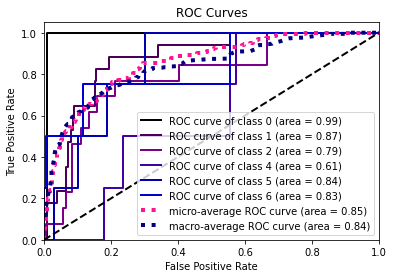

In [ ]:
# roc Curve For Svm
import scikitplot as plt
from sklearn import svm
clf = svm.SVC(probability=True)
clf = clf.fit(x_train, y_train)
y_probas = clf.predict_proba(x_test)
plt.metrics.plot_roc(y_test, y_probas, title='ROC Curves', plot_micro=True, plot_macro=True, classes_to_plot=[0,1,2,4,5,6], ax=None, figsize=None, cmap='nipy_spectral', title_fontsize='large', text_fontsize='medium')
plt

<module 'scikitplot' from '/usr/local/lib/python3.7/dist-packages/scikitplot/__init__.py'>

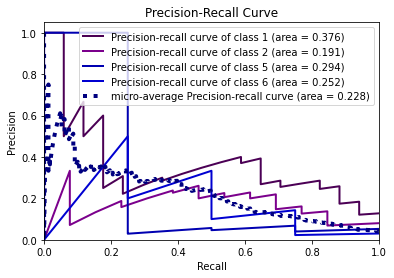

In [ ]:
#Precision-Recall Curve for svm
import scikitplot as skplt
clf = svm.SVC(probability=True)
clf = clf.fit(x_train, y_train)
y_probas = clf.predict_proba(x_test)
skplt.metrics.plot_precision_recall(y_test, y_probas, title='Precision-Recall Curve', plot_micro=True, classes_to_plot=[1,2,5,6], ax=None, figsize=None, cmap='nipy_spectral', title_fontsize='large', text_fontsize='medium')

plt

#6)...Check Train Test Accuracy With Logistic Regression,Roc Curve, PRC

In [ ]:
#train accuracy for Logistic regression
from sklearn.linear_model import LogisticRegression
clf=LogisticRegression()
clf.fit(x_train, y_train)
y_predict = clf.predict(x_train)
print("Accuracy: {}%".format(clf.score(x_train, y_train) * 100 ))

Accuracy: 29.896907216494846%


In [ ]:
#test accuracy for Logistic regression
from sklearn.linear_model import LogisticRegression
clf=LogisticRegression()
clf.fit(x_train, y_train)
y_predict = clf.predict(x_test)
print("Accuracy: {}%".format(clf.score(x_test, y_test) * 100 ))


Accuracy: 17.903930131004365%


<module 'scikitplot' from '/usr/local/lib/python3.7/dist-packages/scikitplot/__init__.py'>

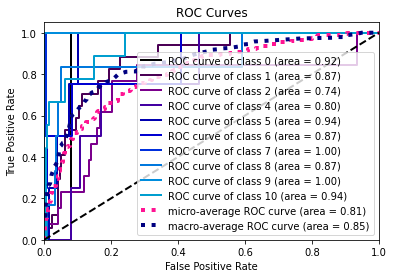

In [ ]:
# roc Curve For Logistic Regresion
import scikitplot as skplt
from sklearn.linear_model import LogisticRegression
clfrf=LogisticRegression()
clfrf = clfrf.fit(x_train, y_train)
y_probas = clfrf.predict_proba(x_test)
skplt.metrics.plot_roc(y_test, y_probas, title='ROC Curves', plot_micro=True, plot_macro=True, classes_to_plot=[0,1,2,4,5,6], ax=None, figsize=None, cmap='nipy_spectral', title_fontsize='large', text_fontsize='medium')
plt

<module 'scikitplot' from '/usr/local/lib/python3.7/dist-packages/scikitplot/__init__.py'>

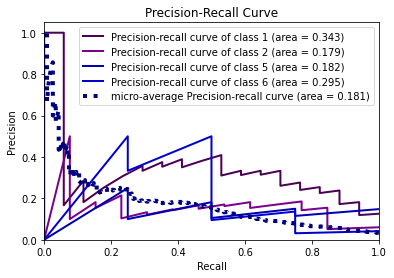

In [ ]:
import scikitplot as skplt

from sklearn.linear_model import LogisticRegression
clfknnn = LogisticRegression()
clfknnn = clfknnn.fit(x_train, y_train)
y_probas = clfknnn.predict_proba(x_test)
skplt.metrics.plot_precision_recall(y_test, y_probas, title='Precision-Recall Curve', plot_micro=True, 
classes_to_plot=[1,2,5,6], ax=None, figsize=None, cmap='nipy_spectral', title_fontsize='large', text_fontsize='medium')

plt


#7)......For Increase the accuracy K=5 fold cross Validation.....

In [ ]:
from sklearn.model_selection import KFold
kf = KFold(n_splits=4)

kf.get_n_splits(x)
KFold(n_splits=5, random_state=None, shuffle=False)
for train_index, test_index in kf.split(x):
    print("TRAIN:", train_index, "TEST:", test_index)
    X_train, X_test = x[train_index], x[test_index]
    y_train, y_test = y[train_index], y[test_index]

In [ ]:
from sklearn.model_selection import cross_val_score
from sklearn import svm
clf = svm.SVC(kernel='linear')
scores = cross_val_score(clf, x, y, cv=5)
scores
print("Accuracy: %0.2f (+/- %0.2f)" % ((scores.mean())*100, scores.std() * 2))